# MTH3302 : Méthodes probabilistes et statistiques pour l'I.A.

Jonathan Jalbert<br/>
Professeur adjoint au Département de mathématiques et de génie industriel<br/>
Polytechnique Montréal<br/>


Le projet a été préparé par Gabriel Gobeil, associé de recherche à Polytechnique Montréal.

---
# Projet A2022 : Récolte des cerfs de Virginie


La description du projet est disponible à l'adresse suivante : https://www.kaggle.com/t/23b6d8c44f1247c78e19a6a902f804af

Ce calepin Jupyter de base permet de charger et de nettoyer les données fournies. La dernière section détaille la génération du fichier des prédictions afin de le soumettre sur Kaggle dans le bon format.

### Données

Dans un premier temps, vous devrez récupérer les données sur Kaggle. Les fichiers disponibles sont les suivants :
- recolte.csv
- permis.csv
- meteo.csv
- essence.csv
- test.csv

**Déposez ces fichiers dans un dossier nommé *data* dans le répertoire de ce calepin.**

Le fichier *recolte.csv* contient les statistiques de chasse au cerf de Viriginie. On y retrouve le nombre de cerfs mâles adultes récoltés annuellement dans certaines zones de chasse du Québec, listé selon le type d'engin utilisé.

Le fichier *permis.csv* contient des informations sur le nombre de permis de chasse aux cerfs de Virginie alloués aux résidents et non-résidents de 1999 à 2020.

Le fichier *meteo.csv* contient certaines variables météorologiques enregistrées à la station Montréal-Trudeau de 1999 à 2021 :
- Mean Temp (°C)	
- Total Rain (mm)	
- Total Snow (cm)	
- Snow on Grnd (cm)

Le fichier *essence.csv* contient des informations sur le prix de détail moyen par mois de l'essence pour Québec et Montréal de 1999 à 2021. Des renseignements additionnels sur les données sont disponibles à l'adresse suivante : https://www150.statcan.gc.ca/t1/tbl1/fr/cv.action?pid=1810000101

Le fichier *test.csv* contient les zones de chasse pour lesquels vous devez prédire le nombre de cerfs mâles adultes récoltés pour l'année 2021, peu importe l'engin de chasse utilisé. La qualité de vos prédictions sera ensuite évaluée lorsque vous les téléverserez sur Kaggle. Vos prédictions seront comparées à celles des autres équipes de la classe.

### Consignes

- Vous devez constituer une équipe de 3 à 5 personnes.
- Au moins une solution doit être proposée sur Kaggle.
- Utilisez votre identifiant d'équipe pour téléverser vos prédictions sur Kaggle.
- Un seul calepin *.ipynb* par équipe doit être remis. Ce fichier documente et illustre la procédure qui vous a permis de produire vos meilleures prédictions. Ce fichier constitue le rapport final du projet.
- Le langage Julia doit être utilisé.
- Votre démarche doit être rigoureusement justifiée (consultez la grille de correction pour vous orienter).

### Quelques conseils

Votre calepin doit permettre à une personne à l'extérieur de l'équipe de comprendre votre démarche et de reproduire vos résultats. Par exemple, une bonne façon de faire consiste à expliquer dans une cellule de texte la tâche qui est accomplie dans la cellule de code suivante. 

Je vous encourage fortement à faire une analyse exploratoire des données pour développer une meilleure expertise du problème. C'est une étape qui est toujours négligée mais qui est essentielle. C'est avec l'analyse exploratoire que vous viendra des idées d'amélioration, comme par exemple créer de nouvelles variables explicatives.

Vous pouvez utiliser directement tout ce qui se trouve dans les notes de cours sans explication et toutes les librairies utilisées dans le cours (incluant mes fonctions).

Ce calepin contient un modèle très simple de prédiction : on n'utilise qu'une seule variable explicative. Ce sera votre travail d'améliorer ces prédictions avec la méthode et les variables de votre choix.

S'il y a des données manquantes, ce sera à vous de traiter ce problème. La plupart du temps, une méthode simple d'imputation (de remplacement) des données manquantes est suffisante.

Prenez la peine de documenter succinctement les essais infructueux. Ce n'est pas nécessaire de les expliquer en détails, mais c'est important de les mentionner dans la discussion avec une raison possible de leur échec. De cette façon, une personne qui reprendra votre travail dans le futur ne perdra pas de temps à réessayer une méthode infructueuse déjà testée.

Vous pouvez aussi indiquer dans votre rapport les raisons qui vous font croire pourquoi une méthode a moins bien performée de ce qui était attendu. Vous pouvez également mentionner ce que vous auriez pu tenter si vous aviez eu plus de temps ou plus de données. L'idée est de guider l'analyste qui prendrait la relève de votre travail.

Vous êtes limités à deux soumissions par jour UTC par équipe sur Kaggle. Je vous suggère donc de bien tester vos modèles localement et de ne téléverser que vos meilleurs prédictions de la journée.

In [461]:
using CSV, DataFrames, Statistics, Dates, Gadfly, ColorSchemes, Impute, StatsBase, MLJ

# on retire l'ambiguité de la fonction transform
transform = DataFrames.transform

transform (generic function with 4 methods)

---
## 1. Chargement de données

#### Récolte annuelle de cerfs par zones de chasse selon les différents engins

In [462]:
recolte = CSV.read("data/recolte.csv", DataFrame)
first(recolte, 5)

,Année,Zone,Engin,Cerfs
,Int64,Int64,String15,Int64
1,1999,2,Arc,58
2,1999,2,Carabine,852
3,1999,2,Indéterminé,12
4,1999,3,Arc,94
5,1999,3,Carabine,1422


#### Nombre de permis de chasse alloués annuellement aux résidents et non-résidents

In [463]:
permis = CSV.read("data/permis.csv", DataFrame)
first(permis, 5)

,Année,Résidents,Résidents premier abbatage,Non-résidents,Total
,Int64,Int64,Int64?,Int64,Int64
1,1998,135409,missing,1230,136639
2,1999,131325,missing,1260,132585
3,2000,137346,missing,1463,138809
4,2001,144074,missing,1551,145625
5,2002,151154,missing,1735,152889


In [464]:
describe(permis)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Int64,Float64,Int64,Int64,Type
1,Année,2009.0,1998,2009.0,2020,0,Int64
2,Résidents,1.46421e5,126315,143829.0,171684,0,Int64
3,Résidents premier abbatage,9081.92,8369,8951.0,9816,11,"Union{Missing, Int64}"
4,Non-résidents,1266.65,691,1230.0,1830,0,Int64
5,Total,1.52426e5,132585,152889.0,173330,0,Int64


#### Moyenne mensuelle du prix de détail de l'essence en cents pour Québec et Montréal

In [465]:
essence = CSV.read("data/essence.csv", DataFrame)
first(essence, 5)

,Mois,Québec,Montréal
,Date,Float64,Float64
1,1997-04-01,60.1,60.3
2,1997-05-01,60.7,60.5
3,1997-06-01,59.4,61.5
4,1997-07-01,57.9,59.7
5,1997-08-01,62.8,64.0


In [466]:
describe(essence)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Any,Any,Int64,DataType
1,Mois,,1997-04-01,2009-12-01,2022-08-01,0,Date
2,Québec,103.841,51.8,105.7,219.7,0,Float64
3,Montréal,105.648,52.2,107.4,216.5,0,Float64


#### Données météorologiques quotidiennes à Montréal-Trudeau entre 1999 et 2021

In [467]:
meteo = CSV.read("data/meteo.csv", DataFrame)
first(meteo, 5)

,Date/Time,Mean Temp (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm)
,Date,Float64?,Float64?,Float64?,Int64?
1,1999-01-01,-20.5,0.0,1.0,2
2,1999-01-02,-19.2,0.0,0.0,2
3,1999-01-03,-8.5,1.2,11.4,7
4,1999-01-04,-9.4,0.0,0.0,8
5,1999-01-05,-14.3,0.0,0.0,8


In [468]:
describe(meteo)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Any,Any,Int64,Type
1,Date/Time,,1999-01-01,2009-12-31,2021-12-31,0,Date
2,Mean Temp (°C),7.47565,-26.5,8.1,30.1,18,"Union{Missing, Float64}"
3,Total Rain (mm),2.29677,0.0,0.0,73.8,26,"Union{Missing, Float64}"
4,Total Snow (cm),0.573052,0.0,0.0,45.6,13,"Union{Missing, Float64}"
5,Snow on Grnd (cm),4.12935,0,0.0,51,2006,"Union{Missing, Int64}"


En regardant le fichier csv, on se rend compte que les nombreuses données manquantes pour Snwo on Grnd correspondent majoritairement à des dates en dehors des périodes hivernales à partir de 2011. On devrait pouvoir les remplacer par 0 sans créer de problème. Les autres données manquantes peuvent être définies par interpolation.

In [469]:
replace!(meteo[!,"Snow on Grnd (cm)"], missing => 0.0);
meteo = Impute.interp(meteo) |> Impute.locf() |> Impute.nocb();

---
## 2. Analyse exploratoire

Cette section consitue une analyse exploratoire superficielle permettant de se familiariser avec les données. C'est une analyse exploratoire sommaire. Je vous encourage fortement à poursuivre cette analyse.

#### 2.1 Quantité de cerfs récoltés annuellement pour tous les engins de chasse

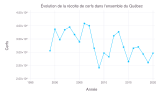

In [470]:
set_default_plot_size(16cm, 10cm)
df = combine(groupby(recolte, :Année), :Cerfs => sum => :Cerfs)
plot(df, x=:Année, y=:Cerfs, Geom.line, Geom.point, Guide.title("Évolution de la récolte de cerfs dans l'ensemble du Québec"))

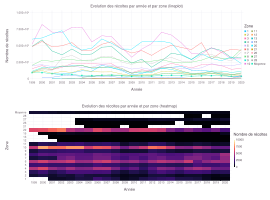

In [471]:
set_default_plot_size(27cm, 20cm)

df_plot = combine(groupby(recolte, [:Zone, :Année]), :Cerfs => sum => :Cerfs)
moyenne_df = combine(groupby(recolte, :Année), :Cerfs => mean => :Cerfs)
moyenne_df.Zone .= "Moyenne"

lineplot = plot(df_plot, 
    x=:Année, Guide.xticks(ticks=[1999:2020;]),
    y=:Cerfs,
    color=:Zone, Scale.color_discrete, 
    Geom.line,
    Guide.ylabel("Nombre de récoltes"), Guide.title("Evolution des récoltes par année et par zone (lineplot)"),
    layer(moyenne_df, x=:Année, y=:Cerfs, Geom.line, Geom.point, color=["Moyenne"]),
)

heatmap = plot(df_plot, 
    x=:Année, Guide.xticks(ticks=[1999:2020;]),
    y=:Zone, Scale.y_discrete,
    color=:Cerfs, Guide.colorkey(title="Nombre de récoltes"), Scale.ContinuousColorScale(palette -> get(ColorSchemes.magma, palette)),
    Geom.rectbin,
    Guide.title("Evolution des récoltes par année et par zone (heatmap)"),
    layer(moyenne_df, x=:Année, y=:Zone, Geom.rectbin, color=:Cerfs),
)

vstack(lineplot, heatmap)

#### 2.2 Analyse des permis vendus

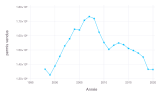

In [472]:
set_default_plot_size(16cm, 10cm)
plot(permis, x=:Année, y=:Total, Geom.line, Geom.point,
    Guide.ylabel("permis vendus"))

Corrélation de Pearson entre les cerfs abbatus et les permis vendus:0.3737258394438486


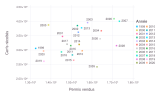

In [473]:
set_default_plot_size(16cm, 10cm)
df2 = innerjoin(combine(groupby(recolte, [:Année]), :Cerfs => sum => :Cerfs), permis, on = :Année)
println("Corrélation de Pearson entre les cerfs abbatus et les permis vendus:",cor(df2.Total, df2.Cerfs))
plot(df2, 
    x=:Total,
    y=:Cerfs,
    label=["$(i)" for i in unique(df.Année)],
    Geom.label,
    Geom.point,
    color=:Année, Scale.color_discrete, 
    Guide.xlabel("Permis vendus"),
    Guide.ylabel("Cerfs récoltés")
)

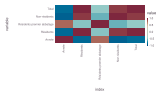

In [474]:
correlation_matrix = cor(Matrix(dropmissing(permis)))
df_corr = DataFrame(correlation_matrix, names(permis))
df_corr.index = names(permis);
plot(stack(df_corr), x=:index, y=:variable, color=:value, Geom.rectbin)

On remarque une légère corrélation positive entre le nombre de permis vendus et le nombre de cerfs récoltés. Remarquons tout de même qu'on ne connaît pas le nombre de permis vendus pour 2021, l'année à prédire. Comme il semblerait que les permis soient à renouveller chaque année, utiliser le nombre de permis de l'année précédente pour prédire le nombre de cerfs récoltés d'une année ne semble pas un choix logique, bien que possible. Comme nous voyons un plateau entre 2019 et 2020, on va supposer que ce plateau se poursuit en 2021 et on et on va dupliquer les valeurs de l'année 2020.

Enfin, puisque les variables Total, Non-résidents et Résidents sont fortement corrélées, on ne va garder que la variable Total. La variable "résidents remier abbatage" aurait pu être intéressante mais il y a trop de valeurs manquantes pour que ce soit utilisé.

In [475]:
permis_2021 = permis[permis.Année .== 2020, :];
permis_2021.Année .= 2021
append!(permis, permis_2021);

In [476]:
permis = select(permis, [:Année, :Total]);
first(permis,3)

,Année,Total
,Int64,Int64
1,1998,136639
2,1999,132585
3,2000,138809


#### 2.4 Analyse de la météo

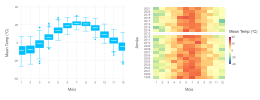

In [477]:
set_default_plot_size(26cm, 10cm)
df = copy(meteo)
df.Année .= DataFrames.transform(df, "Date/Time" => x->year.(x))[!,"Date/Time_function"]
df.Mois  .= transform(df, "Date/Time" => x->month.(x))[!,"Date/Time_function"]
df.Date  .= transform(df, "Date/Time" => x->Date.(2000,month.(x),day.(x)))[!,"Date/Time_function"]

rows = []

# la ligne suivante permet d'afficher pour chaque colonne, neanmoins cela est trop gourmant
# a l'affichage pour le navigateur. Nous affichons alors uniquement pour la température
# for col in names(select(df, Not(["Date/Time", "Année", "Mois", "Date"])))
for col in ["Mean Temp (°C)"]
    df = filter(col .=> c -> !ismissing(c) , df)
    lineplot = plot(df, x=:Mois, Guide.xticks(ticks=[1:12;]), y=col, Geom.boxplot)
    heatmap  = plot(df, 
        x=:Mois, Guide.xticks(ticks=[1:12;]),
        y=:Année, Guide.yticks(ticks=[1999:2021;]), 
        color=col,
        Scale.ContinuousColorScale(palette -> get(ColorSchemes.Spectral, 1-palette), 
            minvalue=min(df[!,col]...),
            maxvalue=max(df[!,col]...)),
        Geom.rectbin)
    push!(rows, hstack(lineplot, heatmap))
end
vstack(rows...)

On remarque quelques variations dans les températures entre les années, notament en hiver où certaines années ont été bien plus froide que d'autres. Aussi, les données en température de l'année 2013 sont manquantes. Plutôt que faire une interpolation dessus, on va plutôt ignorer l'année 2013 dans nos différents modèles utilisant les données météorologiques.

In [605]:
df = copy(meteo)
df.Année .= DataFrames.transform(df, "Date/Time" => x->year.(x))[!,"Date/Time_function"]
df[!,"Année"] .= DataFrames.transform(df, "Date/Time" => x->year.(x))[!,"Date/Time_function"];
df[!,"Mois"]  .= transform(df, "Date/Time" => x->month.(x))[!,"Date/Time_function"];
df_meteo = combine(groupby(df, [:Année, :Mois]), "Mean Temp (°C)" => mean => :Mean_Temp);
df_recolte = combine(groupby(recolte, :Année), :Cerfs => sum => :Cerfs);

In [606]:
col_names = [:Annee, :Cerfs, :_1, :_2, :_3, :_4, :_5, :_6, :_7, :_8, :_9, :_10, :_11, :_12,
    :p1, :p2, :p3, :p4, :p5, :p6, :p7, :p8, :p9, :p10, :p11, :p12] # needs to be a vector Symbols
col_types = [Float64 for i in 1:26]# Create a NamedTuple (A=Int64[], ....) by doing
named_tuple = (; zip(col_names, type[] for type in col_types )...);
df5 = DataFrame(named_tuple) # 0×2 DataFrame
for annee in unique(df_meteo.Année)
    if annee ∉ [1999, 2014, 2021]
        row = Float64[]
        append!(row,annee)
        append!(row, df_recolte[df_recolte.Année.==annee,:].Cerfs[1])
        for mois in unique(df_meteo.Mois)
            append!(row, df_meteo[df_meteo.Année.==annee .&& df_meteo.Mois.==mois, :].Mean_Temp)
            append!(row, df_meteo[df_meteo.Année.==annee-1 .&& df_meteo.Mois.==mois, :].Mean_Temp)
        end
        push!(df5, row)
    end
end
first(df5, 5)

,Annee,Cerfs,_1,_2,_3,_4,_5,_6,_7
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,2000.0,38737.0,-10.0774,-9.22258,-7.01379,-5.11071,1.60323,-1.27097,5.19167
2,2001.0,34751.0,-8.94516,-10.0774,-8.62857,-7.01379,-3.32581,1.60323,6.45333
3,2002.0,38501.0,-4.44194,-8.94516,-4.975,-8.62857,-1.87742,-3.32581,6.88667
4,2003.0,39544.0,-12.5903,-4.44194,-10.7714,-4.975,-3.77097,-1.87742,4.23
5,2004.0,36699.0,-15.1097,-12.5903,-7.88966,-10.7714,-0.309677,-3.77097,6.03


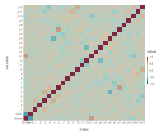

In [607]:
correlation_matrix = cor(Matrix(dropmissing(df5)))
df_corr = DataFrame(correlation_matrix, names(df5))
df_corr.index = names(df5);
plot(stack(df_corr), x=:index, y=:variable, color=:value, Geom.rectbin)

On remarque que les mois sont faiblement corrélés entre eux, prendre une moyenne des températures sur toute l'année risque de ne pas être très intéressant. De manière générale, on remarque que les températures moyennes des mois de l'année en cours et de l'année précédente sont assez faiblement corrélés à la récolte de l'année. Les mois dont les températures moyennes sont les plus corrélés à la récolte de cerfs sont octobre de l'année précédente (positif, +0.446), janvier de l'année précédente (-0.298) et janvier de l'année présente (+0.215).

Nous n'allons pas étendre cette analyse assez fastidieuse aux autres données météorologiques. A la place, nous allons plutôt commencer par considérer toutes les varaibles possibles puis nous éliminerons celles avec une corrélation trop faible par rapport à la récolte de cerfs.

#### 2.4 Analyse de l'essence

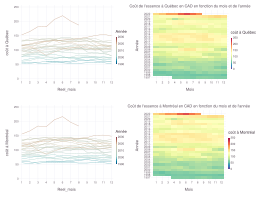

In [608]:
set_default_plot_size(26cm, 20cm)
df = copy(essence)
df.Année .= DataFrames.transform(df, "Mois" => x->year.(x))[!,"Mois_function"]
df.Reel_mois  .= transform(df, "Mois" => x->month.(x))[!,"Mois_function"]
df.Date  .= transform(df, "Mois" => x->Date.(2000,month.(x),day.(x)))[!,"Mois_function"]
rename!(df,:Québec => :"coût à Québec");
rename!(df,:Montréal => :"coût à Montréal");

rows = []
for col in names(select(df, Not(["Mois", "Année", "Reel_mois", "Date"])))
    df = filter(col .=> c -> !ismissing(c) , df)
    if col=="coût à Québec"
        city = "Québec"
    else
        city = "Montréal"
    end
    lineplot = plot(df, x=:Reel_mois, Guide.xticks(ticks=[1:12;]), y=col, color=:Année, Geom.line)
    heatmap  = plot(df, 
        x=:Reel_mois, Guide.xticks(ticks=[1:12;]),
        y=:Année, Guide.yticks(ticks=[1997:2022;]), 
        color=col,
        Scale.ContinuousColorScale(palette -> get(ColorSchemes.Spectral, 1-palette), 
            minvalue=min(df[!,col]...),
            maxvalue=max(df[!,col]...)),
        Guide.xlabel("Mois"),
        Guide.title("Coût de l'essence à "*city*" en CAD en fonction du mois et de l'année"),
        Geom.rectbin)
    push!(rows, hstack(lineplot, heatmap))
end
vstack(rows...)

Nous remarquons une augmentation plus ou moins regulière du prix de l'essence d'année en année. Les prix à Montréal et à Québec sont fortement coréllés. 
L'année `2022` se distingue amplement mais cette dernière n'est pas à prendre en compte pour la prédiction désirée qui est sur l'année 2021.

In [609]:
df_essence = copy(essence)
df_essence.Année .= DataFrames.transform(df_essence, "Mois" => x->year.(x))[!,"Mois_function"]
df_essence.Reel_mois  .= transform(df_essence, "Mois" => x->month.(x))[!,"Mois_function"]
df_essence.Date  .= transform(df_essence, "Mois" => x->Date.(2000,month.(x),day.(x)))[!,"Mois_function"];

col_names = [:Annee, :Cerfs, :_1, :_2, :_3, :_4, :_5, :_6, :_7, :_8, :_9, :_10, :_11, :_12,
    :p1, :p2, :p3, :p4, :p5, :p6, :p7, :p8, :p9, :p10, :p11, :p12] # needs to be a vector Symbols
col_types = [Float64 for i in 1:26]# Create a NamedTuple (A=Int64[], ....) by doing
named_tuple = (; zip(col_names, type[] for type in col_types )...);

df5 = DataFrame(named_tuple) 
for annee in unique(df_essence.Année)
    if annee ∉ [1997, 1998, 1999, 2021, 2022] # on a des année inutiles dans le csv de l'essence
        row = Float64[]
        append!(row,annee)
        append!(row, df_recolte[df_recolte.Année.==annee,:].Cerfs[1])
        for mois in unique(df_essence.Reel_mois)
            append!(row, df_essence[df_essence.Année.==annee .&& df_essence.Reel_mois.==mois, :].Montréal)
            append!(row, df_essence[df_essence.Année.==annee-1 .&& df_essence.Reel_mois.==mois, :].Montréal)
        end
        push!(df5, row)
    end
end
first(df5, 5)

,Annee,Cerfs,_1,_2,_3,_4,_5,_6,_7
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,2000.0,38737.0,71.7,61.2,75.0,61.8,81.7,60.6,79.4
2,2001.0,34751.0,81.3,71.7,84.5,75.0,75.5,81.7,69.0
3,2002.0,38501.0,73.0,81.3,69.0,84.5,68.2,75.5,73.5
4,2003.0,39544.0,75.0,73.0,70.9,69.0,72.8,68.2,74.4
5,2004.0,36699.0,82.3,75.0,95.9,70.9,90.3,72.8,87.2


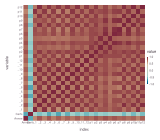

In [610]:
set_default_plot_size(16cm, 14cm)
correlation_matrix = cor(Matrix(dropmissing(df5)))
df_corr = DataFrame(correlation_matrix, names(df5))
df_corr.index = names(df5);
plot(stack(df_corr), x=:index, y=:variable, color=:value, Geom.rectbin)

On remarque que les prix de l'essence sur les différents mois sont très fortement corrélés, et que le nombre de cerfs récoltés est négativement corrélé au prix de l'essence (il n'y a pas forcément une cause et un effet, juste une corrélation). On remarque tout de même que plus on remonte loin dans le temps (:p1 est le mois le plus ancien, c'est janvier de l'année précédente), moins cette corrélation est importante. Il pourrait être bon de considérer uniquement les moix 4 et 8 de l'année en cours et éventuellement le mois 10 de l'année précédente. 

## 3 Création d'un dataframe regroupant un maximum de données

In [611]:
df_recolte = combine(groupby(recolte, [:Zone, :Année]), :Cerfs => sum => :Cerfs);

#### 3.1 Création de la partie "essence" du dataframe

Comme dit plus haut, on ne va prendre pour chaque année les valeurs de certains mois : avril et aout de l'année en cours et octobre de l'année précédente. On va considérer le prix de l'essence dans toutes les zones égal au prix de Montréal.

In [612]:
col_names = [:Année, :Zone, :essence_4, :esence_8, :essence_p10] # needs to be a vector Symbols
col_types = [Float64 for i in 1:5] 
named_tuple = (; zip(col_names, type[] for type in col_types )...);

mois_courante = [4, 8]
mois_precedente = [10]

cp_essence = DataFrame(named_tuple) 
for annee in unique(df_essence.Année)
    if annee ∉ [1997, 1998, 2022] # on a des année inutiles dans le csv de l'essence
        for zone in unique(df_recolte.Zone)
            row = Float64[]
            append!(row,annee)
            append!(row,zone)
            cerfs = df_recolte[df_recolte.Année.==annee .&& df_recolte.Zone.==zone,:].Cerfs
            """
            if(length(cerfs)>0)
                append!(row, cerfs[1])
            else
                append!(row, 0) # push zero ou ne rien faire? Plus simple de push 0 puis d'enlever les lignes ou on a 0 quand on crée la matrice
            end
            """
            for mois in mois_courante
                append!(row, df_essence[df_essence.Année.==annee .&& df_essence.Reel_mois.==mois, :].Montréal)
            end
            for mois in mois_precedente
                append!(row, df_essence[df_essence.Année.==annee-1 .&& df_essence.Reel_mois.==mois, :].Montréal)
            end
            push!(cp_essence, row)
        end
    end
end
first(cp_essence, 5)

,Année,Zone,essence_4,esence_8,essence_p10
,Float64,Float64,Float64,Float64,Float64
1,1999.0,1.0,61.2,67.3,56.3
2,1999.0,2.0,61.2,67.3,56.3
3,1999.0,3.0,61.2,67.3,56.3
4,1999.0,4.0,61.2,67.3,56.3
5,1999.0,5.0,61.2,67.3,56.3


#### 3.2 Création de la partie "météo" du dataframe

C'est la partie la plus difficile du traitement des données d'entrée. On va ici garder un maximum de variables possibles en regardant toutes les données météorologiques sur l'année en cours mais aussi sur les deux années précédentes, regroupées par mois.

In [646]:
meteo_par_année = combine(groupby(transform(meteo, "Date/Time" => x->year.(x)), "Date/Time_function"), 
    ["Mean Temp (°C)" => mean => :Moyenne_température,
     "Total Snow (cm)" => sum => :Cumul_neige,
     "Total Rain (mm)" => sum => :Cumul_pluie,
     "Snow on Grnd (cm)" => mean => :Moyenne_neige_au_sol,
     ]
)
rename!(meteo_par_année,"Date/Time_function" => :Année)

colnames = ["Année"]
for mois in 1:12
    for col in names(select(meteo, Not("Date/Time")))
        for value in ["Moyenne", "Min", "Max", "Somme"]
            push!(colnames, "meteo_$(value)_$(col)_m$(mois)")
            push!(colnames, "meteo_p1_$(value)_$(col)_m$(mois)")
            push!(colnames, "meteo_p2_$(value)_$(col)_m$(mois)")
        end
    end
end

années_considérées = vcat([i for i in 2001:2012], [i for i in 2016:2021]); # rappel: on a un trou en 2013

meteo_decoupee_par_mois = DataFrame(ones(length(unique(meteo_par_année.Année)), length(colnames)), colnames)
meteo_decoupee_par_mois.Année = unique(meteo_par_année.Année)
for année in années_considérées
    meteo_de_l_année = meteo[transform(meteo, "Date/Time" => x->year.(x))[!,"Date/Time_function"] .== année, :]
    meteo_an_moins1 = meteo[transform(meteo, "Date/Time" => x->year.(x))[!,"Date/Time_function"] .== année-1, :]
    meteo_an_moins2 = meteo[transform(meteo, "Date/Time" => x->year.(x))[!,"Date/Time_function"] .== année-2, :]
    for mois in 1:12
        metéo_du_mois = meteo_de_l_année[transform(meteo_de_l_année, "Date/Time" => x->month.(x))[!,"Date/Time_function"] .== mois, :]
        metéo_mois_an_moins1 = meteo_an_moins1[transform(meteo_an_moins1, "Date/Time" => x->month.(x))[!,"Date/Time_function"] .== mois, :]
        metéo_mois_an_moins2 = meteo_an_moins2[transform(meteo_an_moins2, "Date/Time" => x->month.(x))[!,"Date/Time_function"] .== mois, :]
        for c in names(select(metéo_du_mois, Not("Date/Time")))
            # pour les mois de l'année en cours:
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_Moyenne_$(c)_m$(mois)"] .= mean(metéo_du_mois[!,c])
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_Min_$(c)_m$(mois)"]  .= min(metéo_du_mois[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_Max_$(c)_m$(mois)"]  .= max(metéo_du_mois[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_Somme_$(c)_m$(mois)"]  .= sum(metéo_du_mois[!,c])
            # pour les mois de l'année précédente:
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p1_Moyenne_$(c)_m$(mois)"] .= mean(metéo_mois_an_moins1[!,c])
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p1_Min_$(c)_m$(mois)"]  .= min(metéo_mois_an_moins1[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p1_Max_$(c)_m$(mois)"]  .= max(metéo_mois_an_moins1[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p1_Somme_$(c)_m$(mois)"]  .= sum(metéo_mois_an_moins1[!,c])
            # pour les mois d'il y a 2 ans
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p2_Moyenne_$(c)_m$(mois)"] .= mean(metéo_mois_an_moins2[!,c])
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p2_Min_$(c)_m$(mois)"]  .= min(metéo_mois_an_moins2[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p2_Max_$(c)_m$(mois)"]  .= max(metéo_mois_an_moins2[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p2_Somme_$(c)_m$(mois)"]  .= sum(metéo_mois_an_moins2[!,c])
        
        end
    end
end

meteo_par_année = innerjoin(meteo_par_année, meteo_decoupee_par_mois, on=:Année)
first(meteo_par_année, 5)

,Année,Moyenne_température,Cumul_neige,Cumul_pluie,Moyenne_neige_au_sol,meteo_Moyenne_Mean Temp (°C)_m1
,Int64,Float64,Float64,Float64,Float64,Float64
1,1999,8.26562,171.7,769.1,2.08219,1.0
2,2000,6.42842,296.9,677.8,2.46995,1.0
3,2001,8.01671,225.5,536.9,7.70685,-8.94516
4,2002,7.55123,205.7,595.8,1.68767,-4.44194
5,2003,6.43589,181.7,929.9,2.56164,-12.5903


#### 3.3 Jointure des dataframes

In [647]:
# On créée un dataframe sur les récoltes de l'année 2021 juste pour garder cette année pendant les jointures
to_predict = CSV.read("data/test.csv", DataFrame)
a_predire = DataFrame(Année=fill(2021,length(to_predict.Zone)), Zone=to_predict.Zone, Cerfs=fill(0,length(to_predict.Zone)))

dataset = leftjoin(vcat(df_recolte, a_predire), meteo_par_année, on = :Année)
dataset = leftjoin(dataset, cp_essence, on = [:Année, :Zone])
#dataset = leftjoin(vcat(df_recolte, a_predire), cp_essence, on = [:Année, :Zone])
dataset = leftjoin(dataset, permis, on = :Année);
first(dataset, 5)

,Zone,Année,Cerfs,Moyenne_température,Cumul_neige,Cumul_pluie,Moyenne_neige_au_sol
,Int64,Int64,Int64,Float64?,Float64?,Float64?,Float64?
1,2,1999,922,8.26562,171.7,769.1,2.08219
2,3,1999,1519,8.26562,171.7,769.1,2.08219
3,4,1999,4890,8.26562,171.7,769.1,2.08219
4,5,1999,2014,8.26562,171.7,769.1,2.08219
5,6,1999,4846,8.26562,171.7,769.1,2.08219


#### 3.4 Création d'une fenêtre glissante permettant de connaitre les récoltes des années précédentes + quelques autres données des années précédentes

NB: exécuter une seule cellule parmis les 3 suivantes. La deuxieme ne fait pas de différence entre les zones alors que la trosieme si, elle met meme chque zone à chaque ligne. LA premiere fait le delta sur une zone précise

In [738]:
deltas = [1,2,3]
colnames = ["Année", "Zone"]
df_recolte_agrege = combine(groupby(df_recolte, :Année), :Cerfs => sum => :Cerfs);
[push!(colnames, "recolte_Cerfs_année_delta_$(i)") for i in deltas]
[push!(colnames, "Total_permis_delta_$(i)") for i in deltas]

années_considérées = vcat([i for i in 2000:2012], [i for i in 2016:2021]); # rappel: on a un trou en 2013

fenetre_glissante_cerfs = DataFrame(ones(size(dataset,1),length(colnames)), colnames)
fenetre_glissante_cerfs.Année = dataset.Année
fenetre_glissante_cerfs.Zone = dataset.Zone

lignes_a_garder = []
idx = 0
for row in eachrow(fenetre_glissante_cerfs)
    année = row.Année
    zone = row.Zone
    idx = idx +1
    if année in années_considérées 
        push!(lignes_a_garder, idx)
        for delta in deltas
            colname = "recolte_Cerfs_année_delta_$(delta)"
            cerfs_année_delta = dataset[dataset.Année .== année-delta .&& dataset.Zone .== zone, :Cerfs]

            if length(cerfs_année_delta) > 0
                row[colname] = cerfs_année_delta[1]
            else 
                row[colname] = mean(dataset[!, :Cerfs])
            end

            colname = "Total_permis_delta_$(delta)"
            total_année_delta = dataset[dataset.Année .== année-delta .&& dataset.Zone .== zone, :Total]
            if length(total_année_delta) > 0
                row[colname] = total_année_delta[1]
            else 
                row[colname] = mean(dataset[!, :Total])
            end
        end
    end
end

fenetre_glissante_cerfs = fenetre_glissante_cerfs[lignes_a_garder,:]
dataset3 = leftjoin(dataset, fenetre_glissante_cerfs, on = [:Année, :Zone]);

In [736]:
deltas = [1,2]
colnames = ["Année"] #, "Zone"
df_recolte_agrege = combine(groupby(df_recolte, :Année), :Cerfs => sum => :Cerfs);
[push!(colnames, "recolte_Cerfs_année_delta_$(i)") for i in deltas]
[push!(colnames, "Total_permis_delta_$(i)") for i in deltas]

années_considérées = vcat([i for i in 2000:2012], [i for i in 2016:2021]); # rappel: on a un trou en 2013


fenetre_glissante_cerfs = DataFrame(ones(length(années_considérées),length(colnames)), colnames)
fenetre_glissante_cerfs.Année = années_considérées
for row in eachrow(fenetre_glissante_cerfs)
    année = row.Année
    if année in années_considérées 
        for delta in deltas
            colname = "recolte_Cerfs_année_delta_$(delta)"
            cerfs_année_delta = dataset[dataset.Année .== année-delta, :Cerfs]

            if length(cerfs_année_delta) > 0
                row[colname] = cerfs_année_delta[1]
            else #normalement ça n'arrive jamais ce else
                row[colname] = mean(dataset[!, :Cerfs])
            end

            colname = "Total_permis_delta_$(delta)"
            total_année_delta = dataset[dataset.Année .== année-delta, :Total]
            if length(total_année_delta) > 0
                row[colname] = total_année_delta[1]
            else #normalement ça n'arrive jamais ce else
                row[colname] = mean(dataset[!, :Total])
            end
        end
    end
end
dataset3 = leftjoin(dataset, fenetre_glissante_cerfs, on = :Année);

In [650]:
deltas = [1,2,3]
colnames = ["Année"] #, "Zone"
for zone in unique(dataset.Zone)
    [push!(colnames, "recolte_Cerfs_année_delta_$(i)_zone_$(zone)") for i in deltas]
end

années_considérées = vcat([i for i in 2000:2012], [i for i in 2016:2021]); # rappel: on a un trou en 2013

[push!(colnames, "Total_permis_delta_$(i)") for i in deltas]

fenetre_glissante_cerfs = DataFrame(ones(length(années_considérées),length(colnames)), colnames)
fenetre_glissante_cerfs.Année = années_considérées
for row in eachrow(fenetre_glissante_cerfs)
    année = row.Année
    for delta in deltas
        for zone in unique(dataset.Zone)
            colname = "recolte_Cerfs_année_delta_$(delta)_zone_$(zone)"
            cerfs_année_delta = dataset[dataset.Année .== année-delta .&& dataset.Zone .== zone, :Cerfs]

            if length(cerfs_année_delta) > 0
                row[colname] = cerfs_année_delta[1]
            else
                row[colname] = mean(dataset[dataset.Zone .== zone, :Cerfs])
            end
            
            colname = "Total_permis_delta_$(delta)"
            total_année_delta = dataset[dataset.Année .== année-delta, :Total]
            if length(total_année_delta) > 0
                row[colname] = total_année_delta[1]
            else
                row[colname] = mean(dataset[!, :Total])
            end
        end
    end
end
dataset3 = leftjoin(dataset, fenetre_glissante_cerfs, on = :Année);

In [739]:
dataset4 = dataset3[dataset3.Année .<2013 .|| dataset3.Année .>2015,: ];
dataset4 = dataset4[dataset4.Année.>1999,:];

#### 3.5 Suppression des colonnes avec une variance nulle

In [740]:
function remove_null_variance_columns(df::DataFrame)
    cleaned_df = DataFrame()
    for col in names(df)
        s = std(df[!,col])
        if(s != 0)
            cleaned_df[!,col] = df[!,col]
        end
    end
    return cleaned_df
end

dataset5 = remove_null_variance_columns(dataset4);

In [741]:
describe(dataset5)

,variable,mean,min,median,max,nmissing
,Symbol,Float64,Real,Float64,Real,Int64
1,Zone,10.644,1,9.0,28,0
2,Année,2010.4,2000,2009.0,2021,0
3,Cerfs,1862.69,0,1366.0,8204,0
4,Moyenne_température,7.52809,6.24918,7.55123,8.66,0
5,Cumul_neige,212.735,122.3,194.0,342.2,0
6,Cumul_pluie,848.409,536.9,812.4,1225.2,0
7,Moyenne_neige_au_sol,3.14944,1.65301,2.70685,7.70685,0
8,meteo_Moyenne_Mean Temp (°C)_m1,-7.94023,-15.1097,-7.01935,1.0,0
9,meteo_p1_Moyenne_Mean Temp (°C)_m1,-8.41599,-15.1097,-8.94516,1.0,0


#### 3.6 Analyse de la covariance

In [654]:
function get_correlation_matrix(df::DataFrame)
    correlation_matrix = cor(Matrix(df))
    (n,m) = size(correlation_matrix)
    df_corr = DataFrame(abs.(correlation_matrix), names(df))
    df_corr.index = names(df)
    return df_corr
end;

In [655]:
df_corr = get_correlation_matrix(remove_null_variance_columns(dataset5[dataset5.Zone .== 1, :]))
df_corr.Cerfs = abs.(df_corr.Cerfs)
first(sort(df_corr, :Cerfs, rev=true)[2:end, [:Cerfs, :index]], 20)

,Cerfs,index
,Float64,String
1,0.740397,Total
2,0.733117,recolte_Cerfs_année_delta_2_zone_26
3,0.697696,recolte_Cerfs_année_delta_2_zone_27
4,0.674659,recolte_Cerfs_année_delta_1_zone_1
5,0.634505,meteo_p1_Max_Total Rain (mm)_m8
6,0.630785,meteo_p1_Max_Snow on Grnd (cm)_m2
7,0.62162,recolte_Cerfs_année_delta_1_zone_27
8,0.605236,recolte_Cerfs_année_delta_3_zone_15
9,0.600472,recolte_Cerfs_année_delta_1_zone_26


In [714]:
# Un corr_threshold <= 0 signifie que l'on ne retire pas de variables
function retirer_variables_correlees_zone(df, zone, corr_threshold)
    df_corr = get_correlation_matrix(remove_null_variance_columns(df[df.Zone .== zone, :]))
    variables_to_drop = []
    variables_to_keep = ["Année", "Cerfs", "Zone"]
    for name in names(df_corr)
        if name != "index"
            df_corr[:, name] .= abs.(df_corr[:, name])
        end
    end
    for i in 1:size(df_corr)[1]
       for j in i+1:size(df_corr)[1]
            #println(df_corr[j, :index])
            if !(df_corr[i, :index]=="Cerfs" || df_corr[j, :index]=="Cerfs")
                if df_corr[i, j] > corr_threshold
                    if df_corr[i, "Cerfs"] < df_corr[j, "Cerfs"] # on supprime la variable avec la plus faible corrélation avec cerfs
                        if !(df_corr[i, :index] in variables_to_keep) && !(df_corr[i, :index] in variables_to_drop)
                            push!(variables_to_drop, df_corr[i, :index])
                        end
                    else
                        if !(df_corr[j, :index] in variables_to_keep) && !(df_corr[j, :index] in variables_to_drop)
                            push!(variables_to_drop, df_corr[j, :index])
                        end
                    end
                end
            end
        end
    end
    return variables_to_drop
end;

In [545]:
function retirer_variables_correlees_zone(df, zone, corr_threshold)
    df_corr = get_correlation_matrix(remove_null_variance_columns(df[df.Zone .== zone, :]))
    variables_to_drop = []
    variables_to_keep = ["Année", "Cerfs", "Zone"]
    variables_to_keep2 = ["Cerfs"]
    cerfs_corr_sorted = sort(df_corr, :Cerfs, rev=true)[2:end, [:Cerfs, :index]]
    for name in names(df_corr)
        if name != "index"
            df_corr[:, name] .= abs.(df_corr[:, name])
        end
    end
    for i in 1:size(df_corr)[1]
       for j in i+1:size(df_corr)[1]
           if (
                df_corr[i, j] > corr_threshold
                && !(df_corr[i, :index] in variables_to_keep2)
                && !(names(df_corr)[j] in variables_to_keep2)
                && !(df_corr[i, :index] in variables_to_drop)
                && !(names(df_corr)[j] in variables_to_drop)
            )
                corr_cerfs_i = cerfs_corr_sorted[cerfs_corr_sorted.index .== df_corr[i, :index], :Cerfs][1]
                corr_cerfs_j = cerfs_corr_sorted[cerfs_corr_sorted.index .== names(df_corr)[j], :Cerfs][1]
                if corr_cerfs_i > corr_cerfs_j
                    push!(variables_to_drop, names(df_corr)[j])
                else
                    push!(variables_to_drop, df_corr[i, :index])
                end
            end
        end
    end
    return variables_to_drop
end;

#### 3.7 Retrait des variables hautement corrélées

In [498]:
variables_a_enlever = retirer_variables_correlees_zone(dataset5, 1, 0.6)
df_temp = select(dataset5, Not(variables_a_enlever))
df_corr = get_correlation_matrix(remove_null_variance_columns(df_temp[df_temp.Zone .== 1, :]))
df_corr.Cerfs = abs.(df_corr.Cerfs)
first(sort(df_corr, :Cerfs, rev=true)[2:end, [:Cerfs, :index]], 5)

,Cerfs,index
,Float64,String
1,0.740397,Total
2,0.630785,meteo_p1_Max_Snow on Grnd (cm)_m2
3,0.600472,recolte_Cerfs_année_delta_1_zone_26
4,0.590551,meteo_p1_Moyenne_Total Snow (cm)_m1
5,0.546846,meteo_p1_Max_Total Rain (mm)_m6


#### 3.8 Définitions de fonctions utiles pour la suite

In [60]:
function normalize_dataset(df)
    # Normalise les données d'entrée d'un modèle sous forme de dataset
    # Ne normalise pas les zones
    for col in names(select(df, Not([:Zone, :Cerfs, :Année])))
        df[!, col] .= convert(Vector{Float64}, df[!, col])
        for zone in unique(df.Zone)
            x̄ = mean(df[df.Zone .== zone,col])
            s = std(df[df.Zone .== zone,col])
            
            mini = minimum(df[df.Zone .== zone,col])
            maxi = maximum(df[df.Zone .== zone,col])
            
            if(s > 0)
               df[df.Zone .== zone, col] = (df[df.Zone .== zone,col] .- x̄) ./ s
            end
        end
    end
    col = :Année
    x̄ = mean(df[!,col])
    s = std(df[!,col])
    mini = minimum(df[!,col])
    maxi = maximum(df[!,col])
            
    df[!, col] = (df[!, col] .- x̄) ./ s
    return df
end;

In [61]:
function normalize_output(df)
    y_normalisations = DataFrame(Zone = Int64[], ȳ = Float64[], std = Float64[])
    df[!,:Cerfs] = convert(Vector{Float64}, df[!,:Cerfs])
    for zone in unique(df.Zone)
        y_zone = df[df.Zone .== zone, :Cerfs]
        ystd = std(y_zone)
        ȳ   = mean(y_zone)
        push!(y_normalisations, [zone, ȳ, ystd])
        df[df.Zone .== zone, :Cerfs] .= (y_zone.-ȳ)./ystd
    end
    return y_normalisations
end;

function retrieve_output(y, zones, normalisations)
    result = Float64[]
    i = 1
    for zone in zones
        filter = normalisations[normalisations.Zone .== zone, :]
        push!(result, (y[i].* filter[1, :std]) .+ filter[1, :ȳ])
        i += 1
    end
    return result
end;

In [62]:
vars =[v for v in names(dataset5) if !occursin("meteo",v)];
dataset6 = select(dataset5, vars);

## 4. Ajustement de différents modèles de régression linéaire

#### 4.1. Définition des fonctions d'entrainement, de prédiction et d'analyse

In [64]:
using LinearAlgebra

In [65]:
function train_models_by_zone(train::DataFrame, λ::Float64, corr_threshold::Float64, y_normalisations)
    models = DataFrame(Zone = Int64[], β̂=Vector{Float64}[], ȳ = Float64[], std = Float64[], variables_to_drop = Vector{String}[])  # On initialise le DataFrame vide
    zones = groupby(train, :Zone)  # On groupe les données par zone
    
    for zone in zones  # Pour chaque zone de chasse,
        if corr_threshold > 0
            variables_to_drop = retirer_variables_correlees_zone(copy(DataFrame(zone)), zone.Zone[1], corr_threshold)
            push!(variables_to_drop, "Cerfs")
            push!(variables_to_drop, "Zone")
        else
            variables_to_drop = ["Cerfs", "Zone"]
        end
        y = zone.Cerfs
        mean_y = mean(y)
        s_y = std(y)
        n = length(y)
        x = select(zone, Not(variables_to_drop))
        X = Matrix(hcat(ones(n), x))
        m = length(X)
        #print("x")
        if λ < 0.00000000001
            β̂ = Vector(X\y)  # Estimation des coefficients de régression
        else
            β̂ = Vector((X'*X + λ*I) \ (X' * y))  # Estimation des coefficients de régression avec pénalité
        end
        #yhat = X*β̂
        #yhat = retrieve_output(yhat, zone.Zone, y_normalisations)
        #yreel = retrieve_output(y, zone.Zone, y_normalisations)
        #e = yreel .- yhat
        #SSE = sum( e.^2 )
        #println("SSE zone ",zone.Zone," ",SSE," n=",n)
        
        push!(models, [zone.Zone[1], β̂, mean_y, s_y, variables_to_drop])  # On ajoute ça au DataFame
    end
    
    return models
end

function predict_by_zone(test::DataFrame, models::DataFrame)
    ŷ = Float64[]
    
    for i in eachrow(test)
        model = filter(:Zone => zone -> zone .== i.Zone, models)
        if size(model)[1] > 0
            x_test = test[test.Zone .== i.Zone, :]
            variables_to_drop = model[1, :variables_to_drop]
            select!(x_test, Not(variables_to_drop))
            β̂ = model[1, :β̂]    
            global mean_y = model[1, :ȳ]
            global s_y = model[1, :std]
            X = Matrix(hcat(ones(1), x_test))
            y = convert(Float64, (X * β̂)[1])
        else
            y = 0
        end
        push!(ŷ, y)
    end
    return ŷ
end;

function plot_results(y, ŷ, zones)
    plot(
        x=y, 
        y=ŷ,
        color=zones,
        Scale.color_discrete,
        Geom.point,
        label=["$(i)" for i in zones],
        Geom.label,
        Guide.ylabel("Prédiction"),
        Guide.xlabel("Valeur réelle"),
        intercept = [0], slope = [1], Geom.abline(color="red", style=:dash)
    )
end;

#### 4.2 Modèles linéaires avec regression Ridge utilisant un grand nombre de variables 

Nous construisons ici des modeles pour chaque année et chaque zone. A la dernière itération, les modèles gardés en mémoire correspondent à ceux de l'année 2021 (apris sur les années 2020 et moins), on peut donc les utiliser pour faire notre prédiction.

RMSE moyen : 660.8649135692572
RMSE médian : 599.2802478624803


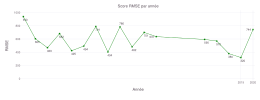

In [67]:
range_annee=sort(unique(dataset5.Année))[begin+1:end]

df = normalize_dataset(copy(dataset5))
y_normalisations = normalize_output(df)

range=sort(unique(df.Année))[begin+1:end]
#range=[2021]
cols=["Année"]
[push!(cols, "$(zone)") for zone in unique(df.Zone)]
resultats = DataFrame(ones(length(range), length(unique(df.Zone))+1), cols)
resultats.Année .= range
vraies_valeurs = DataFrame(ones(length(range), length(unique(df.Zone))+1), cols)
vraies_valeurs.Année .= range

rmse_par_année = []
i=1
for année_à_prédire in range
    train = df[df.Année .< année_à_prédire,  :]
    test  = df[df.Année .== année_à_prédire, :]

    y_train = train.Cerfs

    y_test = test.Cerfs;
    trained_models = train_models_by_zone(train, 1., 0.7, y_normalisations)
    ŷ      = predict_by_zone(test, trained_models)
    ŷ      = retrieve_output(ŷ, test.Zone, y_normalisations)
    y_test = retrieve_output(y_test, test.Zone, y_normalisations)
    i=1
    for zone in test.Zone
        resultats[resultats.Année .== année_à_prédire, "$(zone)"] .= ŷ[i]
        vraies_valeurs[resultats.Année .== année_à_prédire, "$(zone)"] .= y_test[i]
        i+=1
    end
    push!(rmse_par_année, rms(y_test, ŷ))
end

vraies_valeurs.Année .= range_annee
resultats.Année .= range_annee

println("RMSE moyen : $(mean(rmse_par_année))")
println("RMSE médian : $(median(rmse_par_année))")


set_default_plot_size(26cm, 10cm)
plot(x=range_annee[begin:end-1], y=rmse_par_année[begin:end-1], Geom.line, Geom.point, color=[colorant"green"],
    label=["$(Int64(ceil(rmse)))" for rmse in rmse_par_année[begin:end-1]],
    Geom.label,
    Guide.xlabel("Année"),
    Guide.xticks(ticks=range_annee[end-2:end-1]),
    Guide.ylabel("RMSE"),
    Guide.title("Score RMSE par année"))


On remarque que les RMSE sont plutôt élevés, bien plus que ce qu'on obtiendrait avec un modèle très simple utilisant une seule varaible explicative comme l'année ou le nombre de permis de chasse délivrés. Ceci est sans soute du au fait que, même en enlevant les variables corrélées entre elles, nous avons toujours plus de variables explicatives que de données d'entraînement (d'autant plus qu'on entraine un modèle par zone). Les coefficients de régression permettent alors très bien d'expliquer les données d'entraînement mais ne permettent pas du tout de prédire une nouvelle valeur.

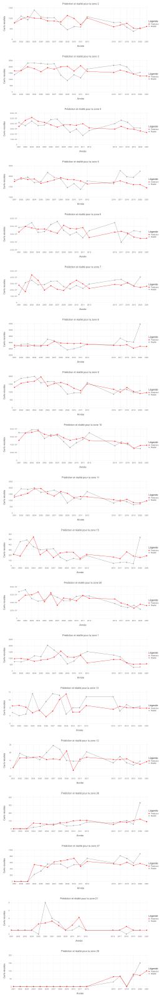

In [68]:
figs = []
for zone in unique(df.Zone)
    push!(figs,
        plot(x=range_annee, y=resultats[!, "$(zone)"], color=[colorant"red"], Geom.line, Geom.point,
            layer(x=range_annee[begin:end-1], y=vraies_valeurs[vraies_valeurs.Année .< range_annee[end], "$(zone)"], Geom.point, Geom.line, color=[colorant"grey"]),
            Guide.xlabel("Année"),
            Guide.ylabel("Cerfs récoltés"),
            Guide.title("Prédiction et réalité pour la zone $(zone)"),
            Guide.manual_color_key("Légende", ["Prédiction", "Réalité"], ["red", "grey"]),
            Guide.xticks(ticks=range_annee)
        )
    )
end
set_default_plot_size(26cm, 160cm)
vstack(figs...)

Ecrire une conclusion sur ce qu'on constate quand on fait ça. Eventuellement remettre la génération du csv en output

#### 4.3 Prédiction à partir d'un seul modèle et non d'un modèle par zone

Afin de bénéficier de plus de données d'entrainement, nous avons essayé d'entrainer un seul model commun à toutes les zones. Cela nécessite un encodage one hot des zones à ajouter en tant que variables explicatives. Nous allons utiliser toutes les données antérieures à 2020 et estimer la validité du modèle sur l'année 2020.

In [69]:
df = copy(dataset6)
df_train = df[df.Année.<2020 .&& df.Zone.!=21,:] # on va également enlever la zone 21 car absente de l'année 2020
df_val = df[df.Année.==2020,:]
M = select(df_train, [:Zone => ByRow(isequal(v))=> Symbol(v) for v in unique(df_train.Zone)]);
M2 = select(df_val, [:Zone => ByRow(isequal(v))=> Symbol(v) for v in unique(df_val.Zone)]);
df2 = hcat(df_train, M);
df3 = hcat(df_val, M2);

In [70]:
X_train = Matrix(select(df2, Not(["Zone","Cerfs"]))); # en raison de l'encodage one-hot, on n'a pas besoin d'une colonne remplie de 1
y_train = df2.Cerfs;
#X_train = Matrix(M)
X_val = Matrix(select(df3, Not(["Zone","Cerfs"])));
#X_val = Matrix(M2)
y_val = df3.Cerfs;

In [71]:
β̂ = X_train\y_train;
e = y_train - X_train*β̂
SSE = e'e
println("SSE sur les données d'entrainement: ",SSE)

y_pred = X_val*β̂
RMSE = rms(y_val, y_pred)
println("RMSE sur l'année de validation 2020: ",RMSE)

SSE sur les données d'entrainement: 9.275206573312984e7
RMSE sur l'année de validation 2020: 2140.6120228020395


On remarque déjà que le RMSE sur les données de validation est très élevé, ce qui laisse penser qu'un modèle général plutôt qu'un modèle par zone est une mauvaise idée. Il est en réalité même plus élevé qu'un modèle prenant uniquement l'encodage one-hot des zones (qui a un RMSE de 2139.5 en validation), les variables explicatives ont donc des influences différentes selon la zone. Considérer les coefficients de régressions égaux pour toutes les zones impacte négativement nos résultats.

#### 4.4 Création de modèles avec un nombre limité de variables
##### 4.4.1 Analyse approfondie d'un modèle pour une zone donnée
Nous allons ici chercher à construire le meilleur modèle possible pour la zone 2 uniquement. Ceci pourrait nous donner une idée des variables à utiliser par la suite. Attention tout de même,nous avons constaté en répétant le procédé avec différentes zones que les résultats changaient considérablement.

In [868]:
# Un corr_threshold <= 0 signifie que l'on ne retire pas de variables
# Je remets ici la fonction que j'utilisais de mon côté car utiliser celle plus optimisée donne d'autres résultats
function retirer_variables_correlees_zone(df, zone, corr_threshold)
    df_corr = get_correlation_matrix(remove_null_variance_columns(df[df.Zone .== zone, :]))
    variables_to_drop = []
    variables_to_keep = ["Année", "Cerfs", "Zone"]
    for name in names(df_corr)
        if name != "index"
            df_corr[:, name] .= abs.(df_corr[:, name])
        end
    end
    for i in 1:size(df_corr)[1]
       for j in i+1:size(df_corr)[1]
            if !(df_corr[i, :index]=="Cerfs" || df_corr[j, :index]=="Cerfs")
                if df_corr[i, j] > corr_threshold
                    if df_corr[i, "Cerfs"] < df_corr[j, "Cerfs"] # on supprime la variable avec la plus faible corrélation avec cerfs
                        if !(df_corr[i, :index] in variables_to_keep) && !(df_corr[i, :index] in variables_to_drop)
                            push!(variables_to_drop, df_corr[i, :index])
                        end
                    else
                        if !(df_corr[j, :index] in variables_to_keep) && !(df_corr[j, :index] in variables_to_drop)
                            push!(variables_to_drop, df_corr[j, :index])
                        end
                    end
                end
            end
        end
    end
    return variables_to_drop
end;

In [869]:
zone = 2
df = remove_null_variance_columns(dataset5[dataset5.Zone .== zone, :])
df_train = df[df.Année.<2020,:] 
df_val = df[df.Année.==2020,:]
y_train = df_train.Cerfs;
y_val = df_val.Cerfs;
n = length(y_train)

z = fill(zone, n)
temp = DataFrame(Zone=z);
df_train = hcat(temp,df_train)
z = fill(zone, 1)
temp = DataFrame(Zone=z);
df_val = hcat(temp,df_val)
variables_a_enlever = ["Zone","Cerfs"]
[push!(variables_a_enlever, v) for v in retirer_variables_correlees_zone(df_train, zone, 0.5)]

X_train = hcat(ones(n), Matrix(select(df_train, Not(variables_a_enlever)))); 
X_val = hcat(ones(1),Matrix(select(df_val, Not(variables_a_enlever))));

In [870]:
β̂ = X_train\y_train;
e = y_train - X_train*β̂
SSE = e'e
println("SSE sur les données d'entrainement: ",SSE)
p = size(X_train, 2) #prend déjà en compte la colonne remplie de zéros
σ̂² = SSE / (n-p)

y_pred = X_val*β̂
RMSE = rms(y_val, y_pred)
println("RMSE sur l'année de validation 2020: ",RMSE)

SSE sur les données d'entrainement: 356380.09647278563
RMSE sur l'année de validation 2020: 27.686268390337432


On peut procéder à une analyse des coefficients de régression pour savoir quelles variables choisies semblent avoir un effet significatif. Pour ce faire, on construit un interval de confiance autour des betas grâce aux quartiles de la loi de Student. Si 0 se trouve dans l'intervalle, on ne peut pas rejeter l'hypothèse que le coefficient devrait être nul.

In [871]:
using Distributions

In [872]:
# Niveau de confiance
α = .05
v = diag(inv(X_train'X_train))
# Calcul du quantile d'ordre (1-α/2) de la loi de Student à (n-p) degrés de liberté
q = quantile(TDist(n-p), 1-α/2)
# Intervalles de confiance à 95%
se = q * sqrt.(σ̂² * v)
a = round.(β̂ - se, digits=3)
b = round.(β̂ + se, digits=3)

vars = ["intercept"]
[push!(vars, v) for v in names(select(df_train, Not(variables_a_enlever)))]
p = length(vars)
for i in 1:p
    print("β ",vars[i]," = ", β̂[i]," [",a[i]," ",b[i],"]")
    if (a[i]<0 && b[i]>0)
        print("  xxx Beta non significatif xxx")
    end
    print("\n")
end

β intercept = 27648.97951900176 [-10048.828 65346.787]  xxx Beta non significatif xxx
β Année = -13.41662632348923 [-32.013 5.18]  xxx Beta non significatif xxx
β meteo_p1_Max_Total Snow (cm)_m1 = -21.605354659842728 [-35.194 -8.017]
β meteo_Max_Total Snow (cm)_m11 = -10.262212917883616 [-31.704 11.179]  xxx Beta non significatif xxx
β Total = 0.0031457111066745956 [-0.006 0.012]  xxx Beta non significatif xxx


En analysant les β, on se rend compte que la plupart sont non significatifs. Ceci est dû au très faible nombre de données d'entraînement ou aux possibles multicolinéarités (on enlève uniquement les variables très corrélées 2 à 2) qui rendent ces valeurs β très instables. Ainsi, l'erreur de validation assez faible laisse penser qu'on peut utiliser ce modèle pour faire de la prédiction, mais on ne pourra pas utiliser l'information sur la significativité des β pour réduire le nombre de variables explicatives. Aussi, faire le test de student demande d'inverser la matrice X alors, ce qui pourrait faire planter julia si la matrice est non inversible.

##### 4.4.2 Construction ascendante d'un modèle avec sélection de features pas à pas pour une seule zone

In [890]:
function init_datas(df, zone, annee, corr_treshold)
    df2 = copy(df)
    df2 = remove_null_variance_columns(df[df.Zone .== zone, :])
    df_train = df2[df2.Année.<annee,:] 
    df_val = df2[df2.Année.==annee,:]
    y_train = df_train.Cerfs;
    y_val = df_val.Cerfs;
    n = length(y_train)
    
    z = fill(zone, n)
    temp = DataFrame(Zone=z); # il faut remettre la colonne Zone qui a été enlevée car variance nulle. Elle est nécessaire dans retirer_variables_correlees_zone 
    df_train = hcat(temp,df_train)
    z = fill(zone, 1)
    temp = DataFrame(Zone=z)
    df_val = hcat(temp,df_val)
    variables_a_enlever = ["Zone","Cerfs"]
    [push!(variables_a_enlever, v) for v in retirer_variables_correlees_zone(df_train, zone, corr_treshold)]
    df_train = select(df_train, Not(variables_a_enlever))
    df_val = select(df_val, Not(variables_a_enlever))
    return df_train, y_train, df_val, y_val
end


function get_Rsquared_adj(X, y)
    β̂ = X\y;
    e = y - X*β̂
    SSE = e'e
    SST = sum( (y .- mean(y)).^2)
    n = size(X,1)
    p = size(X,2) # prend en compte l'éventuelle colonne remplie de 1
    return 1 - (SSE/(n-p))/(SST/(n-1))
end;

function best_model_for_zone(df, y, zone, features, max_features)
    n = size(df,1)
    features_considerees = []
    Rsq_aj_precedent = -1000
    for i in 1:max_features
        Rsq_aj_max = -1000
        idx_max = 1
        for j in 1:length(features)
            if !(features[j] in features_considerees)
                features_temp = copy(features_considerees)
                push!(features_temp, features[j])
                X =  hcat(ones(n), Matrix(select(df, features_temp)))
                Rsq_aj = get_Rsquared_adj(X,y)
                if Rsq_aj > 1.8*Rsq_aj_max
                    Rsq_aj_max = Rsq_aj
                    idx_max = j
                end
            end
        end
        #println("Rsq_aj_max=",Rsq_aj_max)
        if Rsq_aj_max > Rsq_aj_precedent # on n'ajoute la variable que si ça donne un gain en terme de R²ajusté
            push!(features_considerees, features[idx_max])
            Rsq_aj_precedent = Rsq_aj_max
        else
            return features_considerees
        end 
    end
    return features_considerees
end;

In [891]:
zone = 2
df_train, y_train, df_val, y_val = init_datas(dataset5, zone, 2020, 0.6);
features = names(df_train);
features_considerees = best_model_for_zone(df_train, y_train, zone, features, 5);

In [892]:
n = size(df_train,1)
X_train = hcat(ones(n), Matrix(select(df_train, features_considerees))); 
p = size(X_train,2)
X_val = hcat(ones(1),Matrix(select(df_val, features_considerees)));
β̂ = X_train\y_train;
e = y_train - X_train*β̂
SSE = e'e
println("SSE sur les données d'entrainement: ",SSE)
p = size(X_train, 2) #prend déjà en compte la colonne remplie de zéros
σ̂² = SSE / (n-p)

y_pred = X_val*β̂
RMSE = rms(y_val, y_pred)
println("RMSE sur l'année de validation 2020: ",RMSE)

SSE sur les données d'entrainement: 758483.8758949821
RMSE sur l'année de validation 2020: 28.88782816228195


L'erreur obtenue à l'année 2020 sur la zone 2 est très faible, ça semble être un bon modèle. Attention cependant, le SSE est plutôt élevé, cette erreur faible n'est peut être qu'un coup de chance.

In [663]:
# Niveau de confiance
α = .05
v = diag(inv(X_train'X_train))
# Calcul du quantile d'ordre (1-α/2) de la loi de Student à (n-p) degrés de liberté
q = quantile(TDist(n-p), 1-α/2)
# Intervalles de confiance à 95%
se = q * sqrt.(σ̂² * v)
a = round.(β̂ - se, digits=3)
b = round.(β̂ + se, digits=3)

vars = ["intercept"]
[push!(vars, v) for v in names(select(df_train, features_considerees))]
p = length(vars)
for i in 1:p
    print("β ",vars[i]," = ", β̂[i]," [",a[i]," ",b[i],"]")
    if (a[i]<0 && b[i]>0)
        print("  xxx Beta non significatif xxx")
    end
    print("\n")
end

β intercept = 60650.6539379466 [21065.471 100235.837]
β Année = -29.766109785202417 [-49.473 -10.059]


###### 4.4.3 Construction des modèles en mode pas à pas ascendant sur toutes les zones

In [865]:
zones = unique(dataset.Zone);
models = Dict()
preds = Dict()
for z in zones
    if z == 21 || z == 28
        continue
    end
    df_train, y_train, df_val, y_val = init_datas(dataset5, z, 2020, 0.6);
    features = names(df_train);
    features_considerees = best_model_for_zone(df_train, y_train, z, features, 4 );
    n = size(df_train,1)
    X_train = hcat(ones(n), Matrix(select(df_train, features_considerees))); 
    p = size(X_train,2) # prend en compte la colonne remplie de 1
    X_val = hcat(ones(1),Matrix(select(df_val, features_considerees)));
    # regression en considérant le nombre de features max
    β̂ = X_train\y_train;
    models[z] = [β̂ ,features_considerees]
    e = y_train - X_train*β̂
    SSE = e'e
    println("Zone ",z," - SSE sur les données d'entrainement: ",SSE)
    σ̂² = SSE / (n-p)
    y_pred =  X_val*β̂
    y_pred =  max(0, y_pred[1]) # on se permet d'ajouter une fonction max par dessus la régression car on sait que les valeurs sont positives
    preds[z] = y_pred
    RMSE = rms([y_val[1]], [y_pred])
    println("Zone ",z," - RMSE sur l'année de validation 2020: ",RMSE)
end

Zone 2 - SSE sur les données d'entrainement: 758483.8758949821
Zone 2 - RMSE sur l'année de validation 2020: 28.88782816228195
Zone 3 - SSE sur les données d'entrainement: 1.375175728421454e6
Zone 3 - RMSE sur l'année de validation 2020: 136.3471146060292
Zone 4 - SSE sur les données d'entrainement: 9.594317502041817e6
Zone 4 - RMSE sur l'année de validation 2020: 58.41972098784936
Zone 5 - SSE sur les données d'entrainement: 221040.75925939425
Zone 5 - RMSE sur l'année de validation 2020: 142.53220690228045
Zone 6 - SSE sur les données d'entrainement: 4.585410242949458e6
Zone 6 - RMSE sur l'année de validation 2020: 616.3633348452422
Zone 7 - SSE sur les données d'entrainement: 4.0247054333379245e6
Zone 7 - RMSE sur l'année de validation 2020: 1211.9077728158009
Zone 8 - SSE sur les données d'entrainement: 641655.4811496115
Zone 8 - RMSE sur l'année de validation 2020: 1457.329923892869
Zone 9 - SSE sur les données d'entrainement: 1.1044716363365247e6
Zone 9 - RMSE sur l'année de vali

Comme nous manquions de données sur les zones 21 et 28 pour l'année 2020, nous n'avons pas fait de regression sur ces zones. La prédiction sera la moyenne des récoltes dans lesdites zones

In [866]:
preds2 = Float64[]
zones = dataset5[dataset5.Année.==2020,:Zone]
y_reels = dataset5[dataset5.Année.==2020,:Cerfs]
for z in zones
    if z in keys(preds)
       push!(preds2, preds[z][1]) 
    else
        push!(preds2, mean(dataset5[dataset5.Zone.==z,:Cerfs]))
    end
end
println("rms:",rms(preds2, y_reels))
prediction = DataFrame(Zone = test.Zone, Cerfs = preds2)

CSV.write("output_min_rsq_jusqua_2019.csv", prediction)
prediction; # enlver le ; pour afficher les prédictions

rms:529.1824080385841


Le RMSE de validation est relativement décevant, bien que meilleur que le RMSE du benchmark sur l'année 2021. Pour prédire les réclotes de cerfs de 2021, nous pouvons ensuite soit utiliser les modèles enregistrés dans la variable 'models' et entrainés sur les années <= 2019 (ce sont les modèles que nous venons de valider sur 2020), soit réutiliser la même méthode mais en entrainant les données en prenant également en compte l'année 2020. 

Avec le dernier dataset sur lequel nous avons travaillé, la première méthode (cellule du dessus) donne un RMSE sur l'ensemble de test d'environ 700 et la seconde (cellulle du dessous) donne un RMSE d'environ 800.

In [863]:
zones = unique(dataset.Zone);
models = Dict()
preds = Dict()
for z in zones
    if z == 21 || z == 28
        continue
    end
    df_train, y_train, df_val, y_val = init_datas(dataset5, z, 2021, 0.6);
    features = names(df_train);
    features_considerees = best_model_for_zone(df_train, y_train, z, features, 4 );
    n = size(df_train,1)
    X_train = hcat(ones(n), Matrix(select(df_train, features_considerees))); 
    p = size(X_train,2) # prend en compte la colonne remplie de 1
    X_val = hcat(ones(1),Matrix(select(df_val, features_considerees)));
    # regression en considérant le nombre de features max
    β̂ = X_train\y_train;
    models[z] = [β̂ ,features_considerees]
    e = y_train - X_train*β̂
    SSE = e'e
    println("Zone ",z," - SSE sur les données d'entrainement: ",SSE)
    y_pred =  X_val*β̂
    y_pred =  max(0, y_pred[1]) # on se permet d'ajouter une fonction max par dessus la régression car on sait que les valeurs sont positives
    preds[z] = y_pred
end

Zone 2 - SSE sur les données d'entrainement: 759138.6666666665
Zone 3 - SSE sur les données d'entrainement: 2.0896987385203366e6
Zone 4 - SSE sur les données d'entrainement: 9.597339480723053e6
Zone 5 - SSE sur les données d'entrainement: 367996.1280635894
Zone 6 - SSE sur les données d'entrainement: 4.880129147121977e6
Zone 7 - SSE sur les données d'entrainement: 4.836484519715382e6
Zone 8 - SSE sur les données d'entrainement: 1.520459878548171e6
Zone 9 - SSE sur les données d'entrainement: 1.1474023169475696e6
Zone 10 - SSE sur les données d'entrainement: 1.6486030794475488e7
Zone 11 - SSE sur les données d'entrainement: 1.1312054680321245e6
Zone 20 - SSE sur les données d'entrainement: 1.0243495644824618e7
Zone 15 - SSE sur les données d'entrainement: 148383.51354751023
Zone 1 - SSE sur les données d'entrainement: 893095.7859838624
Zone 13 - SSE sur les données d'entrainement: 171.89682776367272
Zone 12 - SSE sur les données d'entrainement: 361.01847706542065
Zone 26 - SSE sur les d

In [867]:
preds2 = Float64[]
zones = dataset5[dataset5.Année.==2021,:Zone]
for z in zones
    if z in keys(preds)
       push!(preds2, preds[z][1]) 
    else
        push!(preds2, mean(dataset5[dataset5.Zone.==z,:Cerfs]))
    end
end
prediction = DataFrame(Zone = test.Zone, Cerfs = preds2)

CSV.write("output_min_rsq_toutes_annees.csv", prediction)
prediction; # enlver le ; pour afficher les prédictions

##### 4.4.5 Construction de modèles en méthode ascendante mais optimisant le RMSE de valivation
Nous avons précédemment construit nos modèles avec la méthode ascedante en maximisant le R²ajusté. Nous avons aussi essayer de reproduire cette méthode en minimisant l'erreur sur un ensemble de validation (l'année 2020)

In [824]:
function get_validation_error(X_train, y_train, X_val, y_val)
    β̂ = X_train\y_train;
    yhat = X_val*β̂ 
    yhat =  max(0, yhat[1])
    return abs(yhat-y_val[1])
end;

function best_model_for_zone_with_validation(df_train, y_train, df_val, y_val, zone, features, max_features)
    n = size(df_train,1)
    features_considerees = []
    erreur_precedente = 100000
    for i in 1:max_features
        erreur_min = 100000
        idx_min = 1
        for j in 1:length(features)
            if !(features[j] in features_considerees)
                features_temp = copy(features_considerees)
                push!(features_temp, features[j])
                X_train =  hcat(ones(n), Matrix(select(df_train, features_temp)))
                X_val =  hcat(ones(1), Matrix(select(df_val, features_temp)))
                err = get_validation_error(X_train, y_train, X_val, y_val)
                if err < erreur_min
                    erreur_min = err
                    idx_min = j
                end
            end
        end
        if erreur_min < erreur_precedente # on n'ajoute la variable que si ça donne un gain en terme de minimisation d'erreur
            push!(features_considerees, features[idx_min])
            #println(features[idx_min])
            erreur_precedente = erreur_min
        else
            return features_considerees
        end 
    end
    return features_considerees
end;

In [885]:
zones = unique(dataset5.Zone);
models = Dict()
preds = Dict()
for z in zones
    if z == 21 || z == 28
        continue
    end
    df_train, y_train, df_val, y_val = init_datas(dataset5, z, 2020, 0.8);
    features = names(df_train);
    features_considerees = best_model_for_zone_with_validation(df_train, y_train, df_val, y_val, z, features, 5)
    n = size(df_train,1)
    X_train = hcat(ones(n), Matrix(select(df_train, features_considerees))); 
    p = size(X_train,2) # prend en compte la colonne remplie de 1
    X_val = hcat(ones(1),Matrix(select(df_val, features_considerees)));
    # regression en considérant le nombre de features max
    β̂ = X_train\y_train;
    models[z] = [β̂ ,features_considerees]
    e = y_train - X_train*β̂
    SSE = e'e
    println("Zone ",z," - SSE sur les données d'entrainement: ",SSE)
    σ̂² = SSE / (n-p)
    y_pred =  X_val*β̂
    y_pred =  max(0, y_pred[1]) # on se permet d'ajouter une fonction max par dessus la régression car on sait que les valeurs sont positives
    preds[z] = y_pred
    RMSE = rms([y_val[1]], [y_pred])
    println("Zone ",z," - RMSE sur l'année de validation 2020: ",RMSE)
end

Zone 2 - SSE sur les données d'entrainement: 1.0581033462568866e6
Zone 2 - RMSE sur l'année de validation 2020: 0.1698707363173071
Zone 3 - SSE sur les données d'entrainement: 2.5835749263825812e6
Zone 3 - RMSE sur l'année de validation 2020: 0.3480007810831012
Zone 4 - SSE sur les données d'entrainement: 1.3771456575174712e7
Zone 4 - RMSE sur l'année de validation 2020: 0.6430110715305091
Zone 5 - SSE sur les données d'entrainement: 475938.2104671112
Zone 5 - RMSE sur l'année de validation 2020: 0.09756410688078176
Zone 6 - SSE sur les données d'entrainement: 8.405129455484115e6
Zone 6 - RMSE sur l'année de validation 2020: 0.10230317178957193
Zone 7 - SSE sur les données d'entrainement: 4.412705984836905e6
Zone 7 - RMSE sur l'année de validation 2020: 0.13152293488974465
Zone 8 - SSE sur les données d'entrainement: 187656.97867980416
Zone 8 - RMSE sur l'année de validation 2020: 5.451385665384805
Zone 9 - SSE sur les données d'entrainement: 1.8775435690409665e6
Zone 9 - RMSE sur l'an

In [886]:
preds2 = Float64[]
zones = dataset5[dataset5.Année.==2020,:Zone]
y_reels = dataset5[dataset5.Année.==2020,:Cerfs]
for z in zones
    if z in keys(preds)
       push!(preds2, preds[z][1]) 
    else
        push!(preds2, mean(dataset5[dataset5.Zone.==z,:Cerfs]))
    end
end
rms(preds2, y_reels)

27.679614119699266

L'erreur sur l'ensemble de validation est assez faible, ce qui est normal puisqu'on a cherché à la minimiser. Cependant, ce n'est pas pour autant que les résultats sur l'ensemble de test (année 2021) seront bons. En effet, les ensembles de test et de validation sont tellement petits (une seule donnée à prédire par zone) qu'on peut difficilement les considérer comme semblables.

In [ ]:
zones = dataset5[dataset5.Année.==2021,:Zone]
preds3 = Float64[]
for z in zones
    if z in keys(models)
        df_temp = df_test[df_test.Zone.==z,:]
        beta = models[z][1]
        variables_considerees = models[z][2]
        X_test = hcat(ones(1), Matrix(select(df_temp, variables_considerees)));
        pred = (X_test*beta)[1]
        push!(preds3, pred) 
    else
        push!(preds3, mean(dataset7[dataset7.Zone.==z,:Cerfs]))
    end
end

In [889]:
df_test = dataset5[dataset5.Année.==2021,:]
zones = dataset5[dataset5.Année.==2021,:Zone]
preds3 = Float64[]
for z in zones
    if z in keys(models)
        df_temp = df_test[df_test.Zone.==z,:]
        beta = models[z][1]
        variables_considerees = models[z][2]
        X_test = hcat(ones(1), Matrix(select(df_temp, variables_considerees)));
        pred = (X_test*beta)[1]
        push!(preds3, pred) 
    else
        push!(preds3, mean(dataset5[dataset5.Zone.==z,:Cerfs]))
    end
end
prediction = DataFrame(Zone = test.Zone, Cerfs = preds3)

CSV.write("output_min_error_val.csv", prediction)
prediction; # enlever le ; pour voir les prédictions

Cette méthode donne un RMSE sur l'ensemble de test d'environ 700, ce qui est encore une fois trop élevé.

##### 4.4.6 minimisation des r² ajustés mais avec regression ridge

In [944]:
function get_Rsquared_adj_Ridge(X, y, λ)
    β̂ = (X'*X + λ*I) \ (X' * y);
    e = y - X*β̂
    SSE = e'e
    SST = sum( (y .- mean(y)).^2)
    n = size(X,1)
    p = size(X,2) # prend en compte l'éventuelle colonne remplie de 1
    return 1 - (SSE/(n-p))/(SST/(n-1))
end;

function best_model_for_zone_Ridge(df, y, zone, features, max_features, λ )
    n = size(df,1)
    features_considerees = []
    Rsq_aj_precedent = -1000
    for i in 1:max_features
        Rsq_aj_max = -1000
        idx_max = 1
        for j in 1:length(features)
            if !(features[j] in features_considerees)
                features_temp = copy(features_considerees)
                push!(features_temp, features[j])
                X =  Matrix(select(df, features_temp))
                Rsq_aj = get_Rsquared_adj_Ridge(X,y, λ)
                if Rsq_aj > 1.8*Rsq_aj_max
                    Rsq_aj_max = Rsq_aj
                    idx_max = j
                end
            end
        end
        if Rsq_aj_max > Rsq_aj_precedent # on n'ajoute la variable que si ça donne un gain en terme de R²ajusté
            push!(features_considerees, features[idx_max])
            Rsq_aj_precedent = Rsq_aj_max
        else
            return features_considerees
        end 
    end
    return features_considerees
end;

function normalize_y(y, y_normalisations, zone)
    filter = y_normalisations[y_normalisations.Zone .== zone, :]
    return (y.-filter[1, :ȳ])./filter[1, :ȳ]
end;

function unnormalize_y(y, y_normalisations, zone)
    result = Float64[]
    filter = y_normalisations[y_normalisations.Zone .== zone, :]
    return (y.* filter[1, :std]) .+ filter[1, :ȳ]
end;

In [945]:
zones = unique(dataset5.Zone);
models = Dict()
preds = Dict()
y_normalisations = normalize_output(dataset5[dataset5.Année.<2020, :])
df_temp = normalize_dataset(copy(dataset5[dataset5.Année.<2020, :]))

,Zone,Année,Cerfs,Moyenne_température,Cumul_neige,Cumul_pluie,Moyenne_neige_au_sol
,Int64,Float64,Int64,Float64,Float64,Float64,Float64
1,2,-1.57255,1239,-1.26529,1.32769,-0.902533,-0.362616
2,3,-1.57255,1993,-1.26529,1.32769,-0.902533,-0.362616
3,4,-1.57255,5881,-1.26529,1.32769,-0.902533,-0.362616
4,5,-1.57255,2111,-1.26529,1.32769,-0.902533,-0.362616
5,6,-1.57255,5639,-1.26529,1.32769,-0.902533,-0.362616
6,7,-1.57255,1358,-1.26529,1.32769,-0.902533,-0.362616
7,8,-1.57255,2784,-1.26529,1.32769,-0.902533,-0.362616
8,9,-1.57255,1680,-1.26529,1.32769,-0.902533,-0.362616
9,10,-1.57255,8204,-1.26529,1.32769,-0.902533,-0.362616


In [948]:
zones = unique(dataset5.Zone);
models = Dict()
preds = Dict()
y_normalisations = normalize_output(dataset5[dataset5.Année.<2020, :])
df_temp = normalize_dataset(copy(dataset5[dataset5.Année.<2020, :]))
λ = 4
for z in zones
    if z == 21 || z == 28
        continue
    end
    df_train, y_train, df_val, y_val = init_datas(df_temp, z, unique(df_temp.Année)[end-1], 0.9);
    features = names(df_train)
    y_train = normalize_y(y_train, y_normalisations, z)
    y_val_saves = copy(y_val)
    y_val = normalize_y(y_val, y_normalisations, z)
    features_considerees = best_model_for_zone_Ridge(df_train, y_train, z, features, 8, λ )
    n = size(df_train,1)
    X_train = hcat(ones(n), Matrix(select(df_train, features_considerees))); 
    p = size(X_train,2) # prend en compte la colonne remplie de 1
    X_val = hcat(ones(1),Matrix(select(df_val, features_considerees)));
    # regression en considérant le nombre de features max
    β̂ = (X_train'*X_train + λ*I) \ (X_train' * y_train);
    models[z] = [β̂ ,features_considerees]
    e = y_train - X_train*β̂
    SSE = e'e
    println("Zone ",z," - SSE sur les données d'entrainement: ",SSE)
    σ̂² = SSE / (n-p)
    y_pred =  X_val*β̂
    y_pred = unnormalize_y(y_pred, y_normalisations, z)
    y_pred =  max(0, y_pred[1]) # on se permet d'ajouter une fonction max par dessus la régression car on sait que les valeurs sont positives
    preds[z] = y_pred
    RMSE = rms([y_val_saves[1]], [y_pred])
    println("Zone ",z," - RMSE sur l'année de validation 2020: ",RMSE)
end

Zone 2 - SSE sur les données d'entrainement: 0.5223740991822994
Zone 2 - RMSE sur l'année de validation 2020: 277.4316180069984
Zone 3 - SSE sur les données d'entrainement: 0.36088523739088507
Zone 3 - RMSE sur l'année de validation 2020: 125.07099860246126
Zone 4 - SSE sur les données d'entrainement: 0.7054127145389989
Zone 4 - RMSE sur l'année de validation 2020: 570.4103608326618
Zone 5 - SSE sur les données d'entrainement: 0.07910477120372507
Zone 5 - RMSE sur l'année de validation 2020: 175.24100501752355
Zone 6 - SSE sur les données d'entrainement: 0.207859782094227
Zone 6 - RMSE sur l'année de validation 2020: 471.7074938968117
Zone 7 - SSE sur les données d'entrainement: 0.22955753351434602
Zone 7 - RMSE sur l'année de validation 2020: 253.59242882684975
Zone 8 - SSE sur les données d'entrainement: 0.045612490696405286
Zone 8 - RMSE sur l'année de validation 2020: 255.90641976025427
Zone 9 - SSE sur les données d'entrainement: 0.5684673876027978
Zone 9 - RMSE sur l'année de val

In [950]:
preds2 = Float64[]
zones = dataset5[dataset5.Année.==2020,:Zone]
y_reels = dataset5[dataset5.Année.==2020,:Cerfs]
for z in zones
    if z in keys(preds)
       push!(preds2, preds[z][1]) 
    else
        push!(preds2, mean(dataset5[dataset5.Zone.==z,:Cerfs]))
    end
end
rms(preds2, y_reels)

971.5811030533295

Lorsqu'on fait la sélection de variables, la régression Ridge semble donner d'encore moins bons résultats que la régression linéaire classique. Il faudrait peut être déterminer les bonnes meilleures valeurs de λ mais c'est unt tâche qui prend énormément de temps (temps en terme d'écriture de code qu'en terme de temps de calcul) puisqu'il n'existe pas de méthode directe: il faut tester plusieurs valeurs de λ pour chaque zone et regarder celle qui minimise l'erreur quadratique (pour chaque zone). Cette tâche n'a donc pas été réalisée.

## 5. Estimation du nombre de cerfs mâles adultes récoltés par zone de chasse en 2021 

On utilise le modèle simple de la section précédente pour estimer le nombre de cerfs récoltés pour chacune des lignes de l'ensemble de test.

#### 5.1 Chargement des données de l'ensemble de test et définition des variables explicatives

In [859]:
df_test = dataset5[dataset5.Année.==2021,:]; # important d'utiliser le même dataframe que pour l'entrainement (mais sur année 2021)


LoadError: ArgumentError: column name :Cerfs_année_delta_1_zone_1 not found in the data frame

#### 5.2 Préparation du fichier des préditions pour téléverser sur Kaggle

Le fichier *benchmark_predictions.csv* généré peut être téléversé sur Kaggle. Il est composé d'une colonne de zones (Zone) et d'une colonne du nombre de cerfs récoltés (Cerfs).

In [861]:
test = CSV.read("data/test.csv", DataFrame);

In [862]:
#[push!(preds3, resultats[resultats.Année .== range_annee[end], "$(zone)"][1]) for zone in test.Zone]
prediction = DataFrame(Zone = test.Zone, Cerfs = preds3)

CSV.write("output_min_error5.csv", prediction)
prediction

,Zone,Cerfs
,Int64,Float64
1,1,779.008
2,2,493.346
3,3,1945.67
4,4,2373.16
5,5,1815.3
6,6,3264.92
7,7,2550.06
8,8,2693.92
9,9,806.463
